# Credit Card fraud detection

### Objective: We aim to predict recognize fraudulent credit card transactions!!

#### Data Source: https://www.kaggle.com/datasets/mlg-ulb/creditcardfraud/data

### Metadata

The dataset contains transactions made by credit cards in September 2013 by European cardholders.
This dataset presents transactions that occurred in two days, where we have 492 frauds out of 284,807 transactions. The dataset is highly unbalanced, the positive class (frauds) account for 0.172% of all transactions.

It contains only numerical input variables which are the result of a PCA transformation. Unfortunately, due to confidentiality issues, we cannot provide the original features and more background information about the data. Features V1, V2, … V28 are the principal components obtained with PCA, the only features which have not been transformed with PCA are 'Time' and 'Amount'. Feature 'Time' contains the seconds elapsed between each transaction and the first transaction in the dataset. The feature 'Amount' is the transaction Amount, this feature can be used for example-dependant cost-sensitive learning. Feature 'Class' is the response variable and it takes value 1 in case of fraud and 0 otherwise.

Given the class imbalance ratio, we recommend measuring the accuracy using the Area Under the Precision-Recall Curve (AUPRC). Confusion matrix accuracy is not meaningful for unbalanced classification.

## Pipeline

1. Import Necessary                                                                                                         
2. Data loading                                                                                                                 
3. Data Exploring                                                                                                                           
4. Data Preprocessing                                                                                                                   
5. Data Splitting                                                                                                           
6. Model Selection and Training                                                                                                 
7. Evaluation                                                                                                               

### Necessary Libraries

In [1]:
#Data manipulation
import pandas as pd
import numpy as np
pd.set_option('display.max_columns', None)
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

#Data visualiztion
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
# Set style for plotting
plt.style.use('fivethirtyeight')
sns.set_style('whitegrid')

#Machine learning
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV

# For model evaluation
from sklearn.metrics import (confusion_matrix, classification_report, 
                            precision_recall_curve, auc, roc_curve, 
                            precision_score, recall_score, f1_score, 
                            roc_auc_score, average_precision_score)

# Machine learning models
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

# Other utilities
import warnings
import time
from tqdm.notebook import tqdm

# Ignore warnings
warnings.filterwarnings('ignore')



### Data Loading

In [2]:
fraud = pd.read_csv("/kaggle/input/creditcardfraud/creditcard.csv") 

### Exploring

In [3]:
fraud.shape 

(284807, 31)

In [4]:
fraud.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [5]:
fraud.info()
# no missing values
# 284,807 rows, 31 columns
# All features are numerical 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

In [6]:
#Summary
fraud.describe().T

,count,mean,std,min,25%,50%,75%,max
Time,284807.0,9.481386e+04,47488.145955,0.000000,54201.500000,84692.000000,139320.500000,172792.000000
V1,284807.0,1.175161e-15,1.958696,-56.407510,-0.920373,0.018109,1.315642,2.454930
V2,284807.0,3.369007e-16,1.651309,-72.715728,-0.598550,0.065486,0.803724,22.057729
V3,284807.0,-1.379537e-15,1.516255,-48.325589,-0.890365,0.179846,1.027196,9.382558
V4,284807.0,2.094852e-15,1.415869,-5.683171,-0.848640,-0.019847,0.743341,16.875344
V5,284807.0,1.021879e-15,1.380247,-113.743307,-0.691597,-0.054336,0.611926,34.801666
V6,284807.0,1.500885e-15,1.332271,-26.160506,-0.768296,-0.274187,0.398565,73.301626
V7,284807.0,-5.620335e-16,1.237094,-43.557242,-0.554076,0.040103,0.570436,120.589494
V8,284807.0,1.149614e-16,1.194353,-73.216718,-0.208630,0.022358,0.327346,20.007208
V9,284807.0,-2.426963e-15,1.098632,-13.434066,-0.643098,-0.051429,0.597139,15.594995


In [7]:
# Check for missing values
missing_values = fraud.isnull().sum()
#print(missing_values[missing_values > 0])

if missing_values.sum() > 0:
    print("There are missing values in the dataset.")
else:
    print("No Missing Values")


No Missing Values


In [8]:
# check duplicates
duplicates = fraud.duplicated().sum()
if duplicates > 0:
    print(f"There are {duplicates} duplicate rows in the dataset.")
else:
    print("No Duplicate Rows Found")


There are 1081 duplicate rows in the dataset.


Class distribution:
Class
0    284315
1       492
Name: count, dtype: int64

Fraud transactions: 0.173% of all transactions


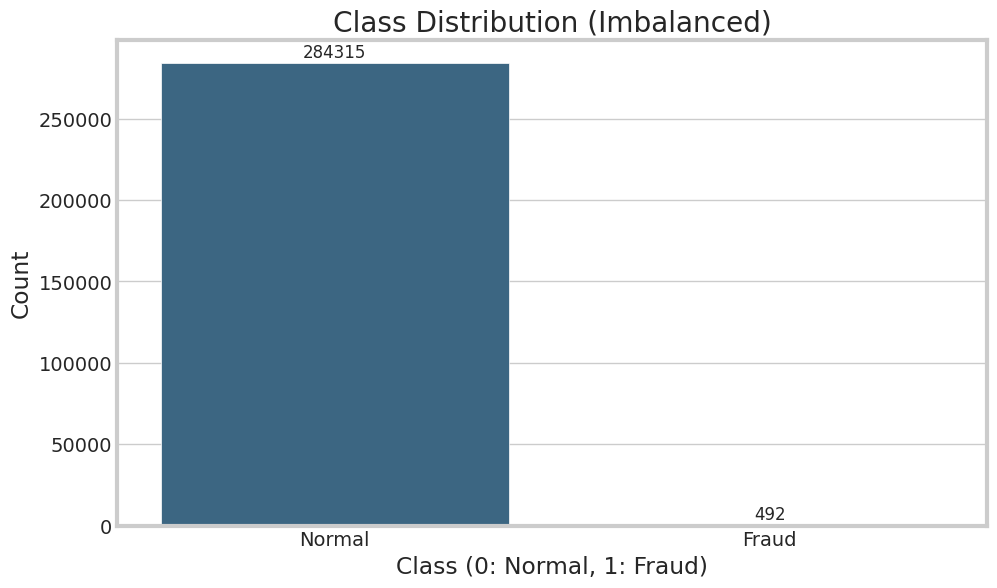

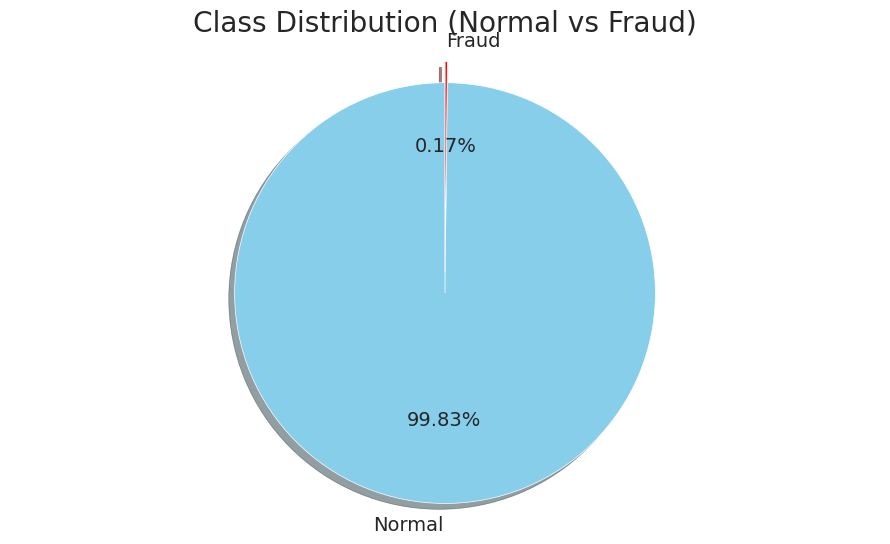

In [9]:
# Show distribution of Classes
# Check class distribution
class_counts = fraud['Class'].value_counts()
print("Class distribution:")
print(class_counts)

# Calculate fraud percentage
fraud_percent = (class_counts[1] / class_counts.sum()) * 100
print(f"\nFraud transactions: {fraud_percent:.3f}% of all transactions")

# Visualize class imbalance
plt.figure(figsize=(10, 6))
sns.countplot(x='Class', data=fraud, palette='viridis')
plt.title('Class Distribution (Imbalanced)')
plt.xlabel('Class (0: Normal, 1: Fraud)')
plt.ylabel('Count')
plt.xticks([0, 1], ['Normal', 'Fraud'])

# Add count labels on top of bars
for i, count in enumerate(class_counts.values):
    plt.text(i, count + 1000, f"{count}", ha='center', va='bottom', fontsize=12)

plt.show()

# Plot a pie chart to visualize the imbalance
plt.figure(figsize=(10, 6))
plt.pie(class_counts, labels=['Normal', 'Fraud'], autopct='%1.2f%%', 
        colors=['skyblue', 'red'], explode=[0, 0.1], shadow=True, startangle=90)
plt.title('Class Distribution (Normal vs Fraud)')
plt.axis('equal')
plt.show()

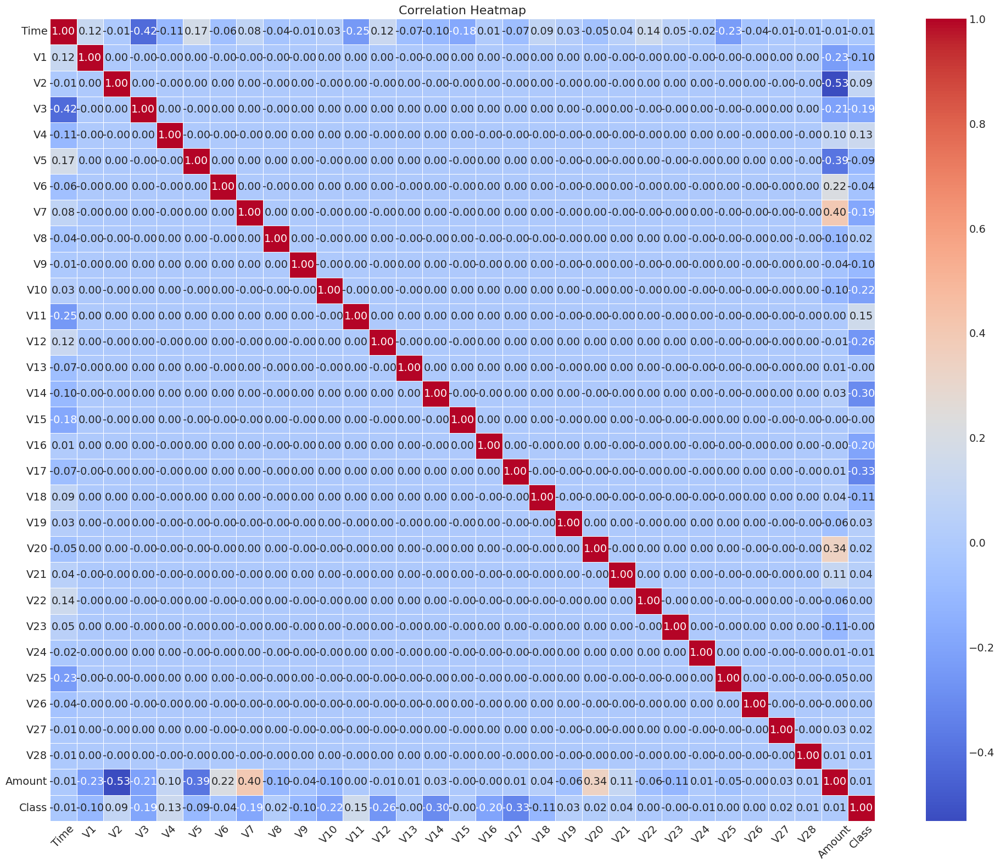

In [10]:
# Create correlation heatmap
plt.figure(figsize=(20, 16))
correlation_matrix = fraud.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap', fontsize=16)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Top 10 features correlated with Class:
V11       0.154876
V4        0.133447
V2        0.091289
V21       0.040413
V19       0.034783
V20       0.020090
V8        0.019875
V27       0.017580
V28       0.009536
Amount    0.005632
Name: Class, dtype: float64


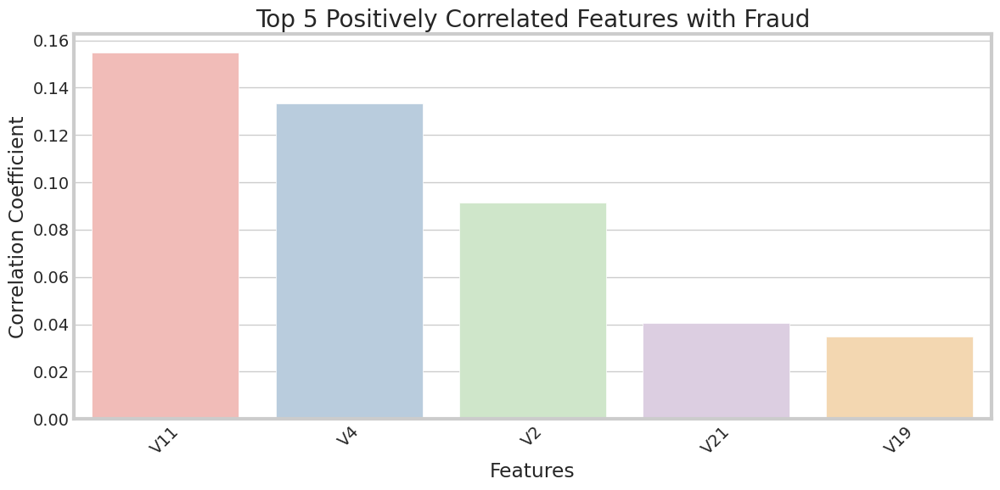

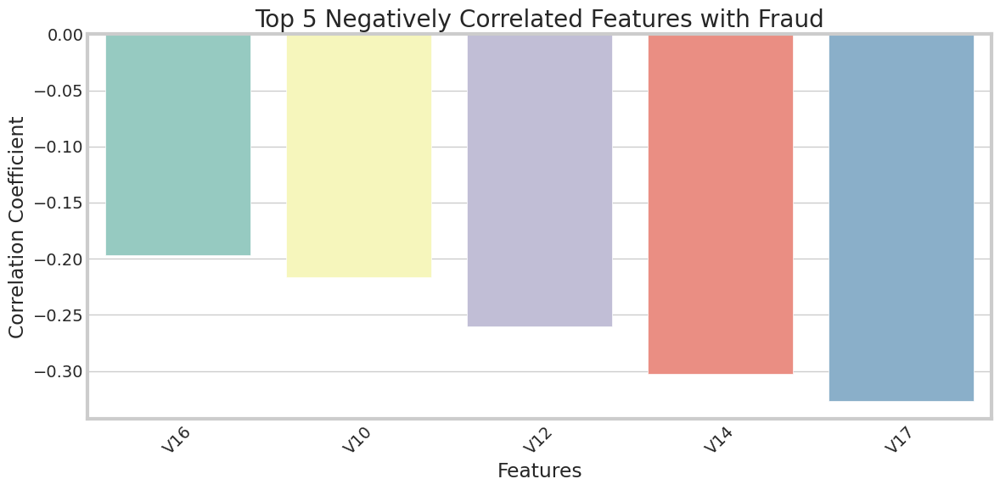

In [11]:
# Find top correlated features with Class
class_correlations = correlation_matrix['Class'].sort_values(ascending=False)
print("Top 10 features correlated with Class:")
print(class_correlations[1:11])

# Plot the top 5 positively and negatively correlated features with Class
top_pos_corr = class_correlations[1:6]
top_neg_corr = class_correlations[-5:]

plt.figure(figsize=(12, 6))
sns.barplot(x=top_pos_corr.index, y=top_pos_corr.values, palette='Pastel1')
plt.title('Top 5 Positively Correlated Features with Fraud')
plt.xlabel('Features')
plt.ylabel('Correlation Coefficient')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


plt.figure(figsize=(12, 6))
sns.barplot(x=top_neg_corr.index, y=top_neg_corr.values, palette='Set3')
plt.title('Top 5 Negatively Correlated Features with Fraud')
plt.xlabel('Features')
plt.ylabel('Correlation Coefficient')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [12]:
# 3D scatter plot of top 3 PCA components
fig = px.scatter_3d(fraud, x='V11', y='V4', z='V2', color='Class',
                  color_continuous_scale=px.colors.sequential.Viridis,
                  title='3D Visualization of Top 3 Important Features')
fig.update_layout(scene=dict(
    xaxis_title='V11',
    yaxis_title='V14',
    zaxis_title='V2'))
fig.show()

### Preproecessing

In [13]:
# Remove Duplicates
fraud.drop_duplicates(inplace=True)


In [14]:
fraud.shape

(283726, 31)

### Splitting

In [15]:
# Separate features and target
X = fraud.drop('Class', axis=1)
y = fraud['Class']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

print(f"Training set shape: {X_train.shape}")
print(f"Testing set shape: {X_test.shape}")
print(f"Class distribution in training set: {np.bincount(y_train)}")
print(f"Class distribution in testing set: {np.bincount(y_test)}")

# Feature scaling (except Time and Amount which might need special handling)
scaler = StandardScaler()
X_train = X_train.copy()
X_test = X_test.copy()

X_train[['Time', 'Amount']] = scaler.fit_transform(X_train[['Time', 'Amount']])
X_test[['Time', 'Amount']] = scaler.transform(X_test[['Time', 'Amount']])



Training set shape: (226980, 30)
Testing set shape: (56746, 30)
Class distribution in training set: [226602    378]
Class distribution in testing set: [56651    95]


### Model Selection , Training and Evaluation


Logistic Regression Model Evaluation:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     56651
           1       0.06      0.87      0.11        95

    accuracy                           0.98     56746
   macro avg       0.53      0.92      0.55     56746
weighted avg       1.00      0.98      0.99     56746

AUPRC: 0.7066
ROC AUC: 0.9657


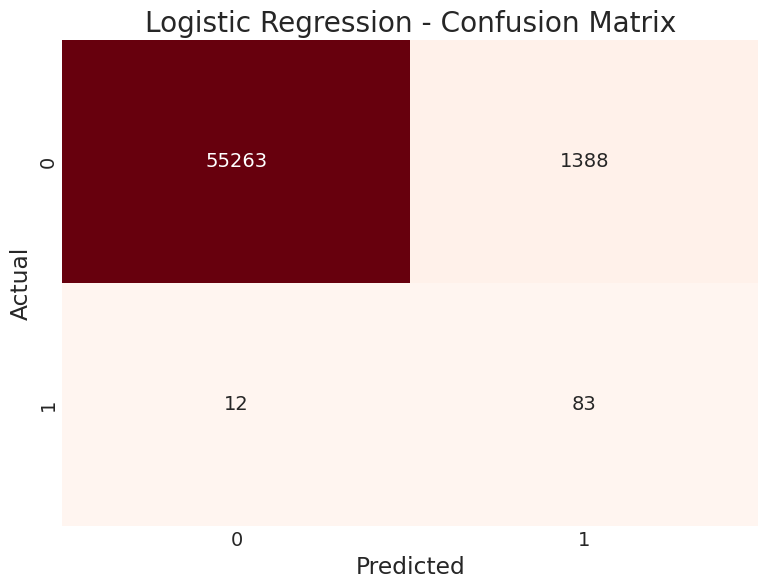

In [17]:
# Initialize Logistic regression

log_reg = LogisticRegression(class_weight='balanced', random_state=42)
log_reg.fit(X_train, y_train)

log_reg_pred = log_reg.predict(X_test)

# Evaluate the model
print("\nLogistic Regression Model Evaluation:")
print(classification_report(y_test, log_reg_pred))

# Calculate AUPRC (Area Under Precision-Recall Curve)
precision_log_reg, recall_log_reg, _ = precision_recall_curve(y_test, log_reg.predict_proba(X_test)[:, 1])
auprc_log_reg = auc(recall_log_reg, precision_log_reg)
print(f"AUPRC: {auprc_log_reg:.4f}")

# Calculate ROC AUC
roc_auc_log_reg = roc_auc_score(y_test, log_reg.predict_proba(X_test)[:, 1])
print(f"ROC AUC: {roc_auc_log_reg:.4f}")

# Plot confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, log_reg_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Reds', cbar=False)
plt.title('Logistic Regression - Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()



#### Random Forest

Training Random Forest model...
Training completed in 48.86 seconds

Random Forest Model Evaluation:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56651
           1       0.97      0.71      0.82        95

    accuracy                           1.00     56746
   macro avg       0.99      0.85      0.91     56746
weighted avg       1.00      1.00      1.00     56746

AUPRC: 0.8043
ROC AUC: 0.9246


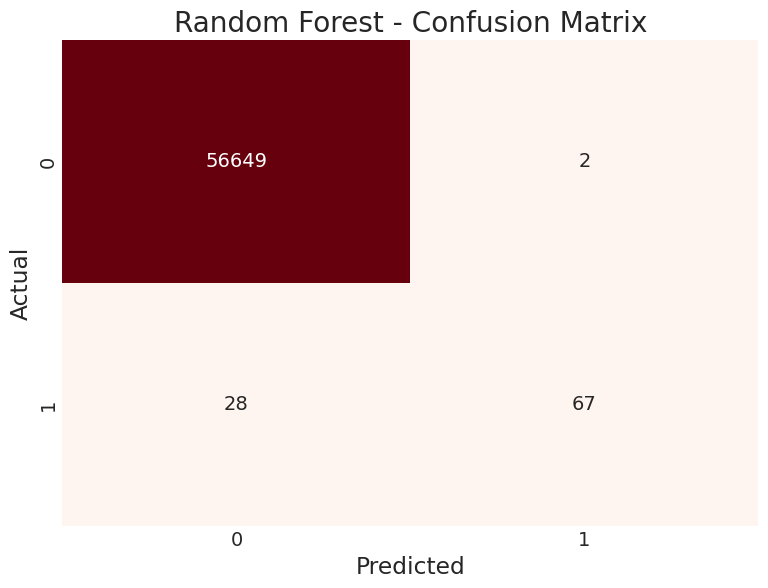

In [18]:
# Initialize the Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced', n_jobs=-1)

# Train the model
print("Training Random Forest model...")
start_time = time.time()
rf_model.fit(X_train, y_train)
train_time = time.time() - start_time
print(f"Training completed in {train_time:.2f} seconds")

# Make predictions
y_pred_rf = rf_model.predict(X_test)
y_pred_proba_rf = rf_model.predict_proba(X_test)[:, 1]

# Evaluate the model
print("\nRandom Forest Model Evaluation:")
print(classification_report(y_test, y_pred_rf))

# Calculate AUPRC (Area Under Precision-Recall Curve)
precision_rf, recall_rf, _ = precision_recall_curve(y_test, y_pred_proba_rf)
auprc_rf = auc(recall_rf, precision_rf)
print(f"AUPRC: {auprc_rf:.4f}")

# Calculate ROC AUC
roc_auc_rf = roc_auc_score(y_test, y_pred_proba_rf)
print(f"ROC AUC: {roc_auc_rf:.4f}")

# Plot confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, y_pred_rf)
sns.heatmap(cm, annot=True, fmt='d', cmap='Reds', cbar=False)
plt.title('Random Forest - Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()





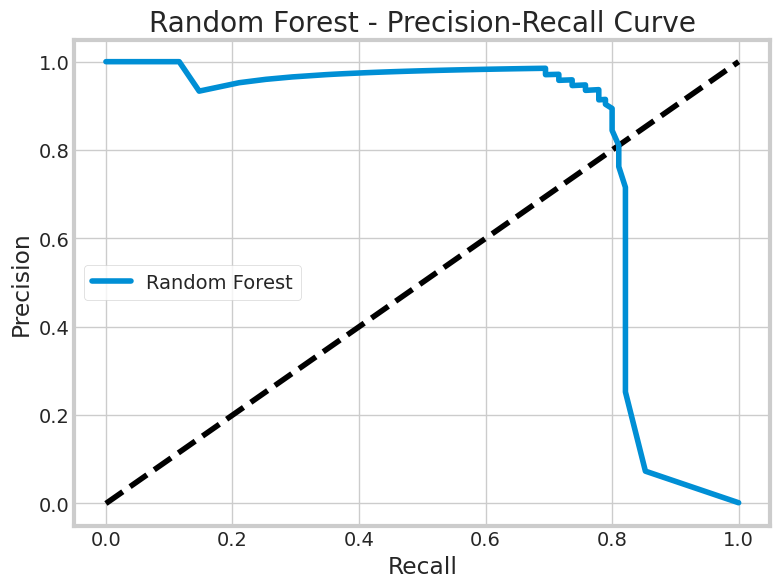

In [19]:
#visualize ROC AUC
plt.figure(figsize=(8, 6))
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(recall_rf, precision_rf, label='Random Forest')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Random Forest - Precision-Recall Curve')
plt.legend()
plt.show()


#### AdaBoost Classifier

Training AdaBoost model...
Training completed in 146.02 seconds

AdaBoost Model Evaluation:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56651
           1       0.83      0.58      0.68        95

    accuracy                           1.00     56746
   macro avg       0.92      0.79      0.84     56746
weighted avg       1.00      1.00      1.00     56746

AUPRC: 0.6610
ROC AUC: 0.9675


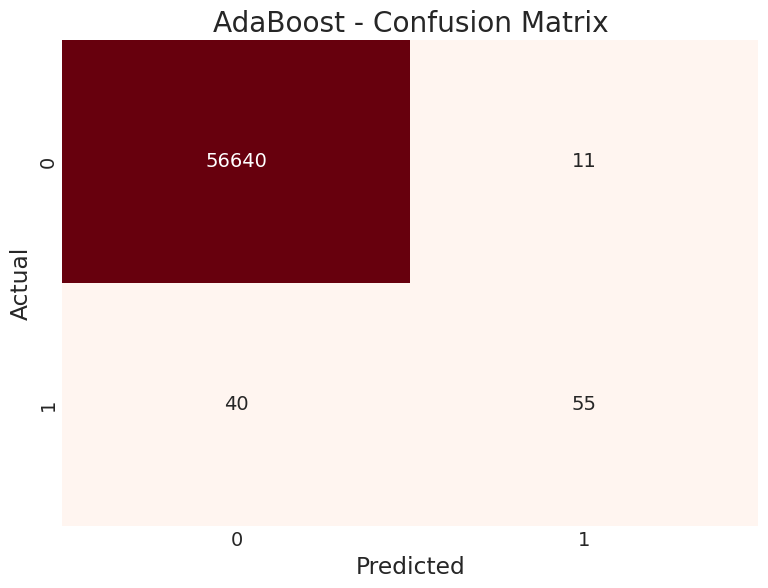

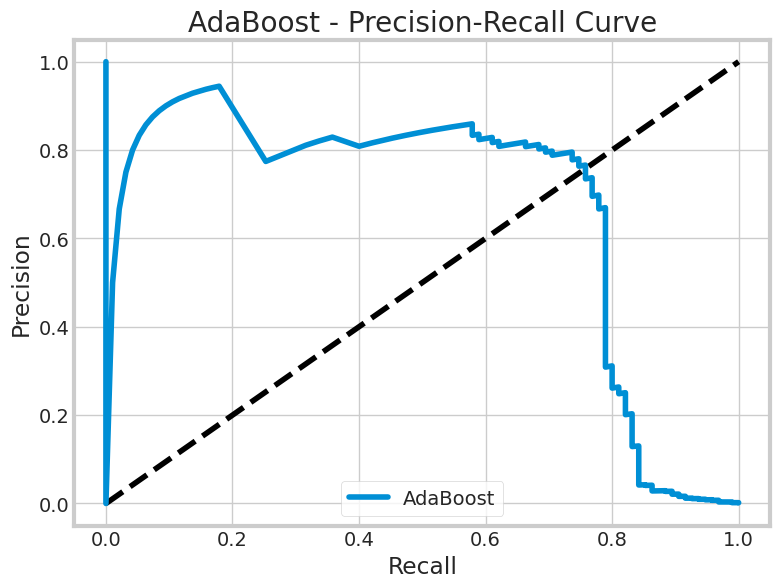

In [20]:
# Initialize the AdaBoost model
ada_model = AdaBoostClassifier(n_estimators=100, random_state=42, learning_rate=0.1)

# Train the model
print("Training AdaBoost model...")
start_time = time.time()
ada_model.fit(X_train, y_train)
train_time = time.time() - start_time
print(f"Training completed in {train_time:.2f} seconds")

# Make predictions
y_pred_ada = ada_model.predict(X_test)
y_pred_proba_ada = ada_model.predict_proba(X_test)[:, 1]

# Evaluate the model
print("\nAdaBoost Model Evaluation:")
print(classification_report(y_test, y_pred_ada))

# Calculate AUPRC
precision_ada, recall_ada, _ = precision_recall_curve(y_test, y_pred_proba_ada)
auprc_ada = auc(recall_ada, precision_ada)
print(f"AUPRC: {auprc_ada:.4f}")

# Calculate ROC AUC
roc_auc_ada = roc_auc_score(y_test, y_pred_proba_ada)
print(f"ROC AUC: {roc_auc_ada:.4f}")

# Plot confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, y_pred_ada)
sns.heatmap(cm, annot=True, fmt='d', cmap='Reds', cbar=False)
plt.title('AdaBoost - Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

#visualize ROC AUC
plt.figure(figsize=(8, 6))
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(recall_ada, precision_ada, label='AdaBoost')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('AdaBoost - Precision-Recall Curve')
plt.legend()
plt.show()


#### CatBoost Classifier

Training CatBoost model...
Training completed in 4.24 seconds

CatBoost Model Evaluation:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56651
           1       0.74      0.79      0.77        95

    accuracy                           1.00     56746
   macro avg       0.87      0.89      0.88     56746
weighted avg       1.00      1.00      1.00     56746

AUPRC: 0.7924
ROC AUC: 0.9613


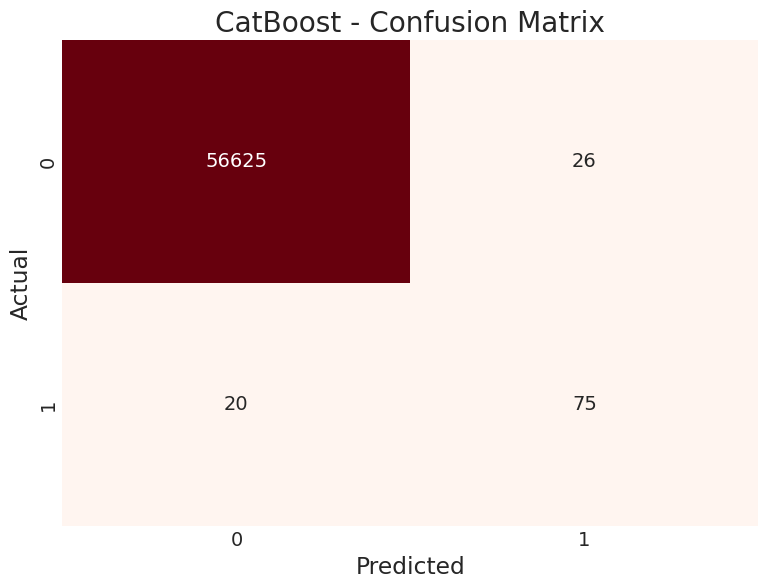

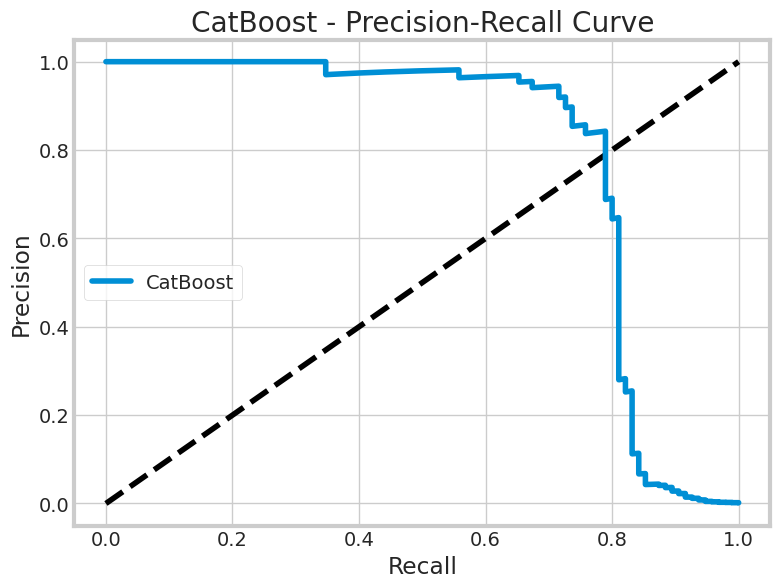

In [21]:
# Initialize the CatBoost model
cat_model = CatBoostClassifier(iterations=100, learning_rate=0.1, random_state=42, 
                               class_weights=[1, 99], verbose=0)

# Train the model
print("Training CatBoost model...")
start_time = time.time()
cat_model.fit(X_train, y_train)
train_time = time.time() - start_time
print(f"Training completed in {train_time:.2f} seconds")

# Make predictions
y_pred_cat = cat_model.predict(X_test)
y_pred_proba_cat = cat_model.predict_proba(X_test)[:, 1]

# Evaluate the model
print("\nCatBoost Model Evaluation:")
print(classification_report(y_test, y_pred_cat))

# Calculate AUPRC
precision_cat, recall_cat, _ = precision_recall_curve(y_test, y_pred_proba_cat)
auprc_cat = auc(recall_cat, precision_cat)
print(f"AUPRC: {auprc_cat:.4f}")

# Calculate ROC AUC
roc_auc_cat = roc_auc_score(y_test, y_pred_proba_cat)
print(f"ROC AUC: {roc_auc_cat:.4f}")

# Plot confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, y_pred_cat)
sns.heatmap(cm, annot=True, fmt='d', cmap='Reds', cbar=False)
plt.title('CatBoost - Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

#visualize ROC AUC
plt.figure(figsize=(8, 6))
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(recall_cat, precision_cat, label='CatBoost')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('CatBoost - Precision-Recall Curve')
plt.legend()
plt.show()


#### XGBoost Classifier

Training XGBoost model...
Training completed in 2.56 seconds

XGBoost Model Evaluation:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56651
           1       0.91      0.78      0.84        95

    accuracy                           1.00     56746
   macro avg       0.96      0.89      0.92     56746
weighted avg       1.00      1.00      1.00     56746

AUPRC: 0.8005
ROC AUC: 0.9742


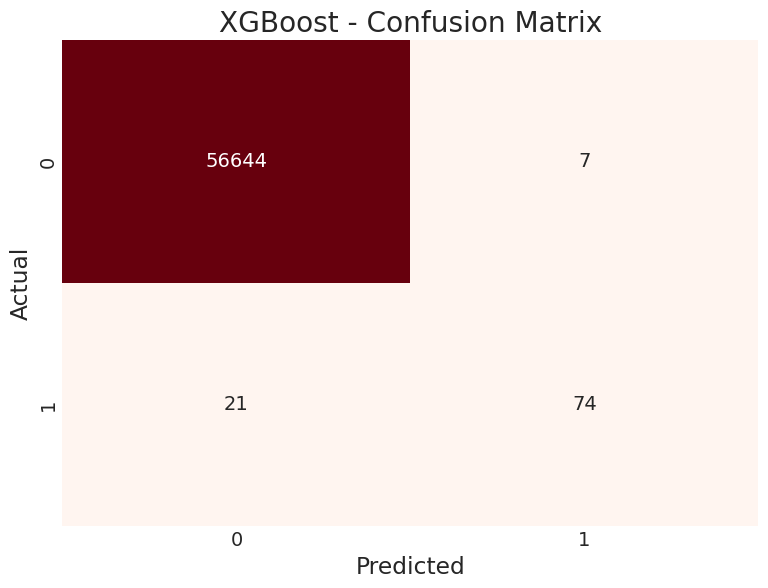

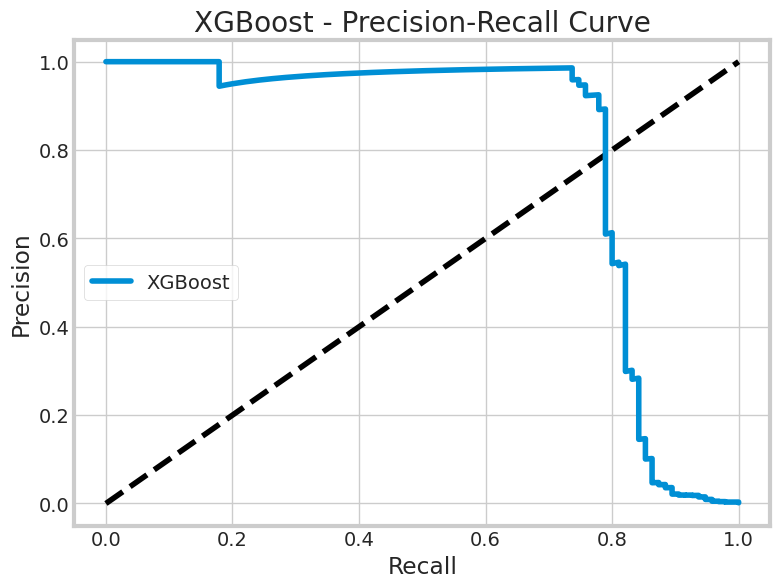

In [22]:
# Initialize the XGBoost model
xgb_model = XGBClassifier(n_estimators=100, learning_rate=0.1, random_state=42, 
                          scale_pos_weight=99, n_jobs=-1)

# Train the model
print("Training XGBoost model...")
start_time = time.time()
xgb_model.fit(X_train, y_train)
train_time = time.time() - start_time
print(f"Training completed in {train_time:.2f} seconds")

# Make predictions
y_pred_xgb = xgb_model.predict(X_test)
y_pred_proba_xgb = xgb_model.predict_proba(X_test)[:, 1]

# Evaluate the model
print("\nXGBoost Model Evaluation:")
print(classification_report(y_test, y_pred_xgb))

# Calculate AUPRC
precision_xgb, recall_xgb, _ = precision_recall_curve(y_test, y_pred_proba_xgb)
auprc_xgb = auc(recall_xgb, precision_xgb)
print(f"AUPRC: {auprc_xgb:.4f}")

# Calculate ROC AUC
roc_auc_xgb = roc_auc_score(y_test, y_pred_proba_xgb)
print(f"ROC AUC: {roc_auc_xgb:.4f}")

# Plot confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, y_pred_xgb)
sns.heatmap(cm, annot=True, fmt='d', cmap='Reds', cbar=False)
plt.title('XGBoost - Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Visualize ROC AUC
plt.figure(figsize=(8, 6))
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(recall_xgb, precision_xgb, label='XGBoost')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('XGBoost - Precision-Recall Curve')
plt.legend()
plt.show()


#### LightGBM Classifier

Training LightGBM model...
[LightGBM] [Info] Number of positive: 378, number of negative: 226602
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.038433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 226980, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
Training completed in 2.78 seconds

LightGBM Model Evaluation:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56651
           1       0.82      0.79      0.81        95

    accuracy                           1.00     56746
   macro avg       0.91      0.89      0.90     56746
weighted avg       1.00      1.00      1.00     56746

AUPRC: 0.8204
ROC AUC: 0.9753


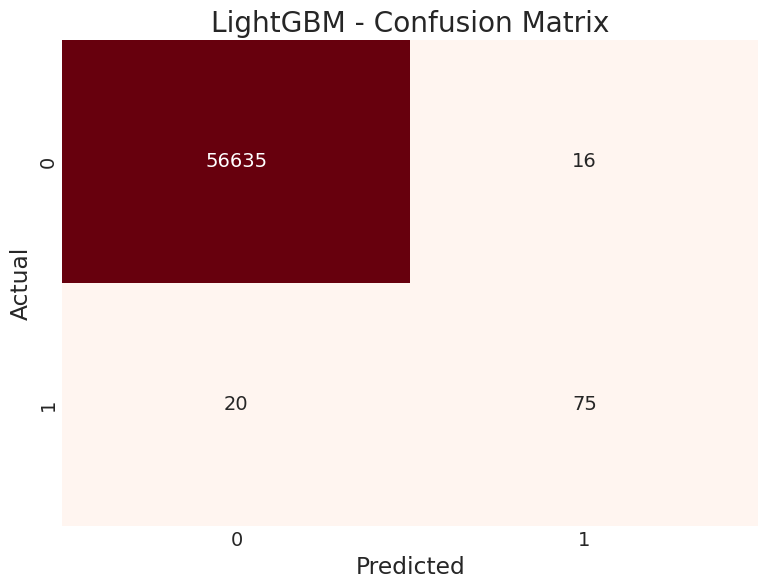

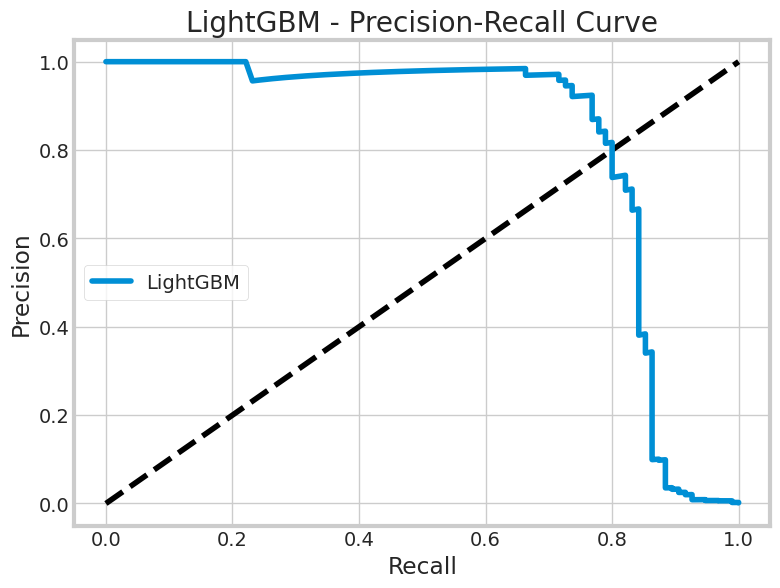

In [23]:
# Initialize the LightGBM model
lgbm_model = LGBMClassifier(n_estimators=100, learning_rate=0.1, random_state=42, 
                           class_weight='balanced', n_jobs=-1)

# Train the model
print("Training LightGBM model...")
start_time = time.time()
lgbm_model.fit(X_train, y_train)
train_time = time.time() - start_time
print(f"Training completed in {train_time:.2f} seconds")

# Make predictions
y_pred_lgbm = lgbm_model.predict(X_test)
y_pred_proba_lgbm = lgbm_model.predict_proba(X_test)[:, 1]

# Evaluate the model
print("\nLightGBM Model Evaluation:")
print(classification_report(y_test, y_pred_lgbm))

# Calculate AUPRC
precision_lgbm, recall_lgbm, _ = precision_recall_curve(y_test, y_pred_proba_lgbm)
auprc_lgbm = auc(recall_lgbm, precision_lgbm)
print(f"AUPRC: {auprc_lgbm:.4f}")

# Calculate ROC AUC
roc_auc_lgbm = roc_auc_score(y_test, y_pred_proba_lgbm)
print(f"ROC AUC: {roc_auc_lgbm:.4f}")

# Plot confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, y_pred_lgbm)
sns.heatmap(cm, annot=True, fmt='d', cmap='Reds', cbar=False)
plt.title('LightGBM - Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Visualize ROC AUC
plt.figure(figsize=(8, 6))
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(recall_lgbm, precision_lgbm, label='LightGBM')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('LightGBM - Precision-Recall Curve')
plt.legend()
plt.show()

### Comparison

Model Comparison (sorted by AUPRC):
           Model  Precision    Recall  F1 Score     AUPRC   ROC AUC
0       LightGBM   0.824176  0.789474  0.806452  0.820447  0.975252
1  Random Forest   0.971014  0.705263  0.817073  0.804317  0.924605
2        XGBoost   0.913580  0.778947  0.840909  0.800450  0.974237
3       CatBoost   0.742574  0.789474  0.765306  0.792382  0.961283
4       AdaBoost   0.833333  0.578947  0.683230  0.660998  0.967532


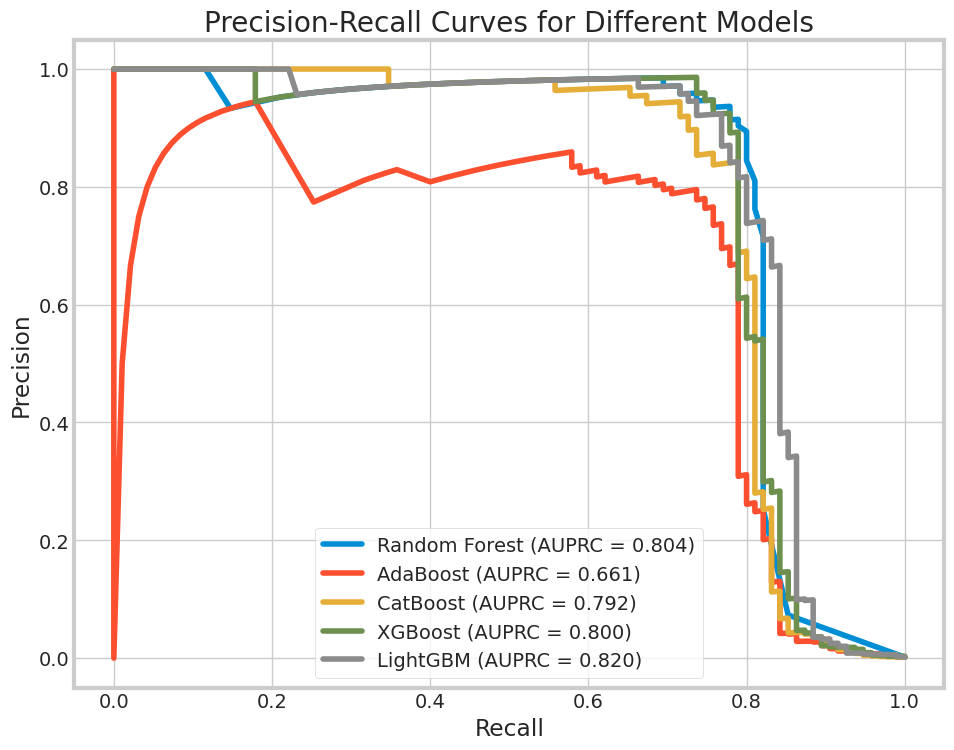

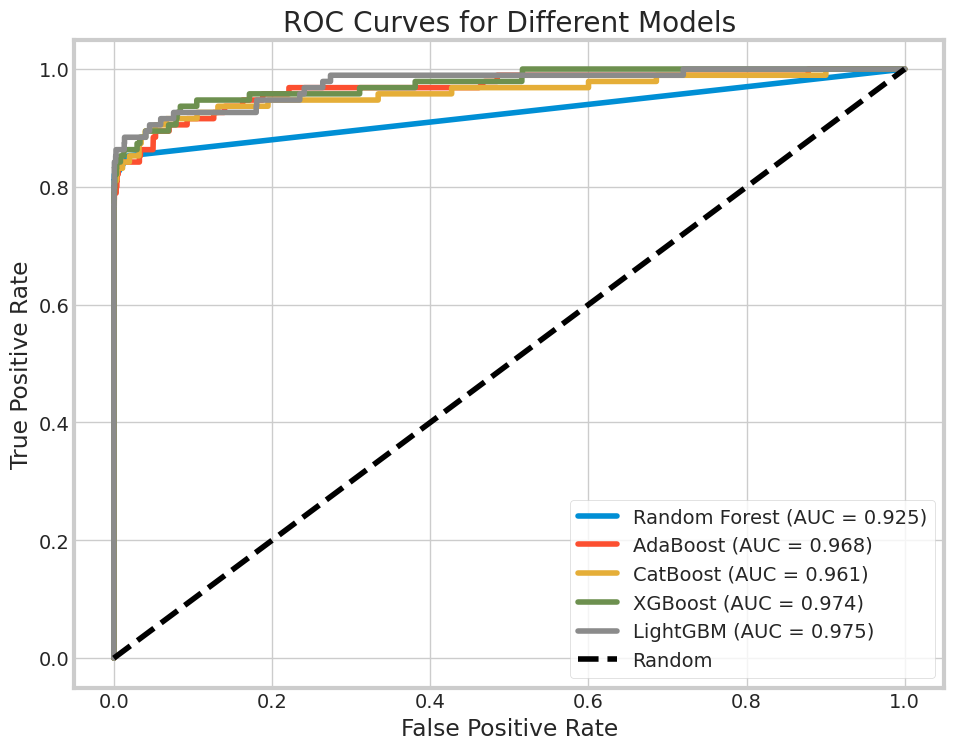

In [24]:
# Collect all model results
models = ['Random Forest', 'AdaBoost', 'CatBoost', 'XGBoost', 'LightGBM']
precision_scores = [precision_score(y_test, y_pred_rf), precision_score(y_test, y_pred_ada), 
                   precision_score(y_test, y_pred_cat), precision_score(y_test, y_pred_xgb),
                   precision_score(y_test, y_pred_lgbm)]
recall_scores = [recall_score(y_test, y_pred_rf), recall_score(y_test, y_pred_ada), 
                recall_score(y_test, y_pred_cat), recall_score(y_test, y_pred_xgb),
                recall_score(y_test, y_pred_lgbm)]
f1_scores = [f1_score(y_test, y_pred_rf), f1_score(y_test, y_pred_ada), 
            f1_score(y_test, y_pred_cat), f1_score(y_test, y_pred_xgb),
            f1_score(y_test, y_pred_lgbm)]
auprc_scores = [auprc_rf, auprc_ada, auprc_cat, auprc_xgb, auprc_lgbm]
roc_auc_scores = [roc_auc_rf, roc_auc_ada, roc_auc_cat, roc_auc_xgb, roc_auc_lgbm]

# Create a DataFrame for comparison
model_comparison = pd.DataFrame({
    'Model': models,
    'Precision': precision_scores,
    'Recall': recall_scores,
    'F1 Score': f1_scores,
    'AUPRC': auprc_scores,
    'ROC AUC': roc_auc_scores
})

# Sort by AUPRC (recommended metric for imbalanced datasets)
model_comparison = model_comparison.sort_values(by='AUPRC', ascending=False).reset_index(drop=True)

print("Model Comparison (sorted by AUPRC):")
print(model_comparison)

# Visualize model comparison
fig = make_subplots(rows=1, cols=2, subplot_titles=('Model Performance (AUPRC)', 'Model Performance (Other Metrics)'))

# AUPRC Comparison
fig.add_trace(
    go.Bar(y=model_comparison['Model'], x=model_comparison['AUPRC'], name='AUPRC', 
           orientation='h', marker_color='darkblue'),
    row=1, col=1
)

# Other metrics
fig.add_trace(
    go.Bar(y=model_comparison['Model'], x=model_comparison['Precision'], name='Precision', 
           orientation='h', marker_color='lightblue'),
    row=1, col=2
)
fig.add_trace(
    go.Bar(y=model_comparison['Model'], x=model_comparison['Recall'], name='Recall', 
           orientation='h', marker_color='darkgreen'),
    row=1, col=2
)
fig.add_trace(
    go.Bar(y=model_comparison['Model'], x=model_comparison['F1 Score'], name='F1 Score', 
           orientation='h', marker_color='orange'),
    row=1, col=2
)
fig.add_trace(
    go.Bar(y=model_comparison['Model'], x=model_comparison['ROC AUC'], name='ROC AUC', 
           orientation='h', marker_color='purple'),
    row=1, col=2
)

fig.update_layout(height=400, width=1000, title_text='Model Performance Comparison')
fig.update_xaxes(title_text='Score', row=1, col=1)
fig.update_xaxes(title_text='Score', row=1, col=2)
fig.update_yaxes(title_text='Model', row=1, col=1)
fig.update_yaxes(title_text='Model', row=1, col=2)
fig.show()

# Compare Precision-Recall curves
plt.figure(figsize=(10, 8))
# Random Forest
plt.plot(recall_rf, precision_rf, label=f'Random Forest (AUPRC = {auprc_rf:.3f})')
# AdaBoost
plt.plot(recall_ada, precision_ada, label=f'AdaBoost (AUPRC = {auprc_ada:.3f})')
# CatBoost
plt.plot(recall_cat, precision_cat, label=f'CatBoost (AUPRC = {auprc_cat:.3f})')
# XGBoost
plt.plot(recall_xgb, precision_xgb, label=f'XGBoost (AUPRC = {auprc_xgb:.3f})')
# LightGBM
plt.plot(recall_lgbm, precision_lgbm, label=f'LightGBM (AUPRC = {auprc_lgbm:.3f})')

plt.title('Precision-Recall Curves for Different Models')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend()
plt.grid(True)
plt.show()

# Compare ROC curves
plt.figure(figsize=(10, 8))
# Random Forest
fpr_rf, tpr_rf, _ = roc_curve(y_test, y_pred_proba_rf)
plt.plot(fpr_rf, tpr_rf, label=f'Random Forest (AUC = {roc_auc_rf:.3f})')
# AdaBoost
fpr_ada, tpr_ada, _ = roc_curve(y_test, y_pred_proba_ada)
plt.plot(fpr_ada, tpr_ada, label=f'AdaBoost (AUC = {roc_auc_ada:.3f})')
# CatBoost
fpr_cat, tpr_cat, _ = roc_curve(y_test, y_pred_proba_cat)
plt.plot(fpr_cat, tpr_cat, label=f'CatBoost (AUC = {roc_auc_cat:.3f})')
# XGBoost
fpr_xgb, tpr_xgb, _ = roc_curve(y_test, y_pred_proba_xgb)
plt.plot(fpr_xgb, tpr_xgb, label=f'XGBoost (AUC = {roc_auc_xgb:.3f})')
# LightGBM
fpr_lgbm, tpr_lgbm, _ = roc_curve(y_test, y_pred_proba_lgbm)
plt.plot(fpr_lgbm, tpr_lgbm, label=f'LightGBM (AUC = {roc_auc_lgbm:.3f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.title('ROC Curves for Different Models')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.grid(True)
plt.show()